<a href="https://colab.research.google.com/github/Sumaira-Ashraf/Safety-Helmet-Detection-Using-Ultralytics-Yollov11/blob/main/Safety_helmet_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Ultralytics YOLOv11 is the latest iteration of the popular YOLO series, a state-of-the-art object detection model known for its speed and accuracy. It builds upon the strengths of previous YOLO versions, introducing significant improvements in architecture and training methods

**PROBLEM STATEMENT**   
**Safety Helmet Detection**

To develop a computer vision system capable of accurately and efficiently detecting whether individuals are wearing safety helmets in real-time video streams, particularly in industrial and construction settings.

In [ ]:

!nvidia-smi

Thu Dec 12 17:46:43 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install ultralytics --upgrade

import ultralytics
ultralytics.checks()

Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.6/112.6 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import Image

In [ ]:
# Install
!pip install roboflow

Roboflow is a powerful platform designed to simplify the entire computer vision pipeline, from data collection and annotation to model training and deployment. It offers a suite of tools and features that make it easier for developers and researchers to build and deploy computer vision applications.



Data Management:

Annotation: Provides a user-friendly interface for labeling images and videos with bounding boxes, polygons, and other annotations.
Data Versioning: Allows you to manage different versions of your dataset, making it easy to experiment with different training setups.
Data Augmentation: Offers a variety of data augmentation techniques to improve model performance and generalization

In [ ]:

from roboflow import Roboflow
rf = Roboflow(api_key="C0KGJxN0rBZRSQh9Bfqt")
project = rf.workspace("data-set-uxram").project("hard-hat-sample-nixaa")
version = project.version(2)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Hard-Hat-Sample-2 in yolov11:: 100%|██████████| 491/491 [00:00<00:00, 7808.55it/s]


In [ ]:
dataset.location


'/content/Hard-Hat-Sample-2'

 **Train YOLO11 Model on a Custom Dataset**

 !yolo: This initiates the Ultralytics command-line interface for working with YOLO models.
task=detect: Specifies the task as object detection.
mode=train: Defines the mode as training.
data={dataset.location}/data.yaml: Points to the data configuration file (data.yaml) located at {dataset.location}.
Make sure to replace {dataset.location} with the actual location of your data.yaml file.
This file should contain information about your dataset, including paths to training and validation images, class names, and the number of classes.

model="yolo11n.pt": Specifies the pre-trained model to be used for fine-tuning. In this case, you're using the YOLOv11 Nano model (yolo11n.pt).

epochs=50: Sets the number of training epochs (iterations) to 50. You can adjust this value depending on your dataset size and desired accuracy.

imgsz=640: Defines the image size used for training. All images will be resized to 640x640 pixels before being fed into the model.

In [ ]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11n.pt" epochs=50 imgsz=640


100% 5.35M/5.35M [00:00<00:00, 258MB/s]
Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/Hard-Hat-Sample-2/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=F

Confusion Matrix: A Visual Representation of Model Performance

A confusion matrix is a table that visualizes the performance of a classification model. It helps us understand how well a model performs in classifying different classes.

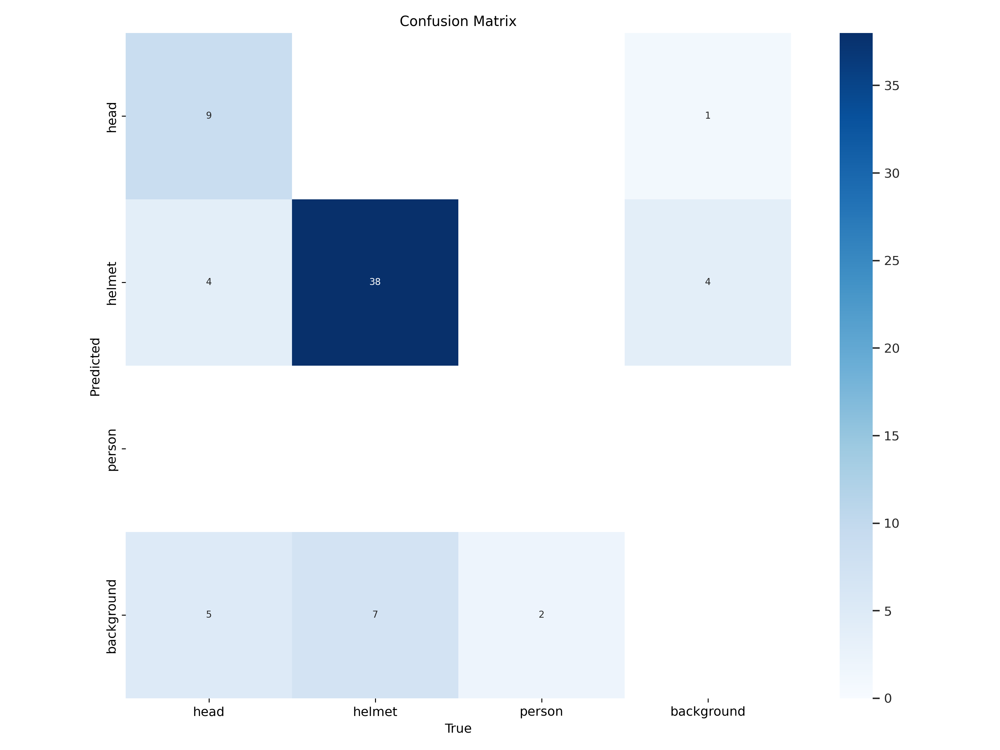

In [ ]:
Image("/content/runs/detect/train/confusion_matrix.png", width=600)


A visualization of the ground truth labels for a training image.

Bounding Boxes: Rectangular boxes drawn around objects of interest, indicating the location and class of each object.

Class Labels: Text labels associated with each bounding box, specifying the object category.

Object IDs: Unique identifiers assigned to each object for tracking purposes

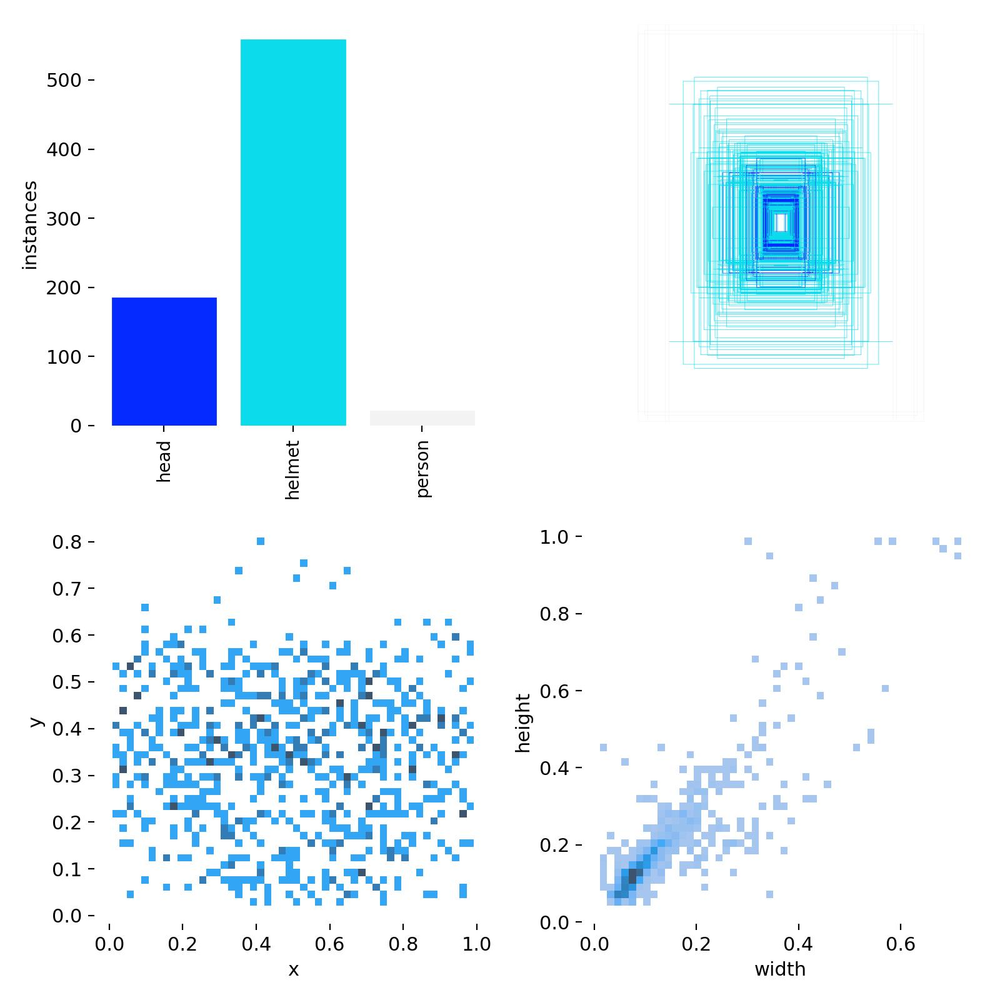

In [ ]:
Image("/content/runs/detect/train/labels.jpg", width=600)


Visualization of the training results for an object detection model.


Precision-Recall Curve: A plot that illustrates the trade-off between precision and recall at different classification thresholds.

Loss Curves: Plots showing the training and validation loss over epochs.


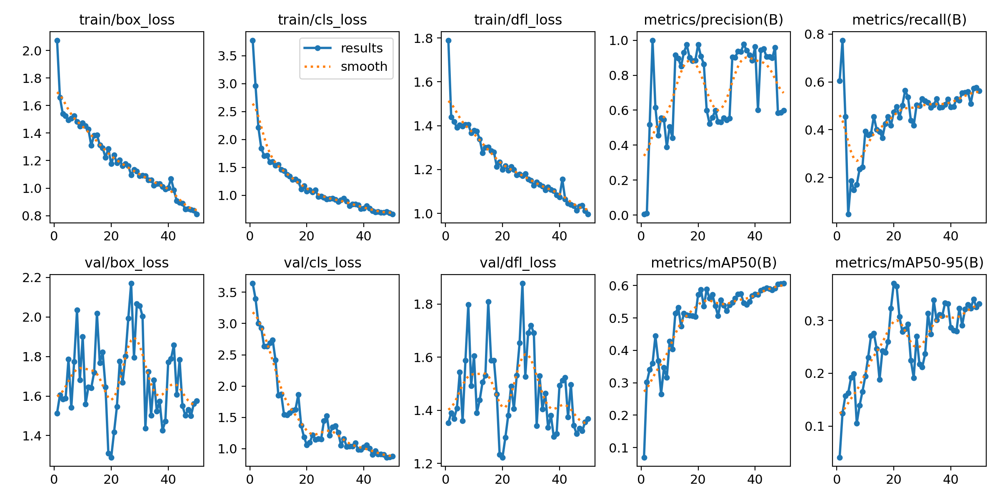

In [ ]:
Image("/content/runs/detect/train/results.png", width=600)


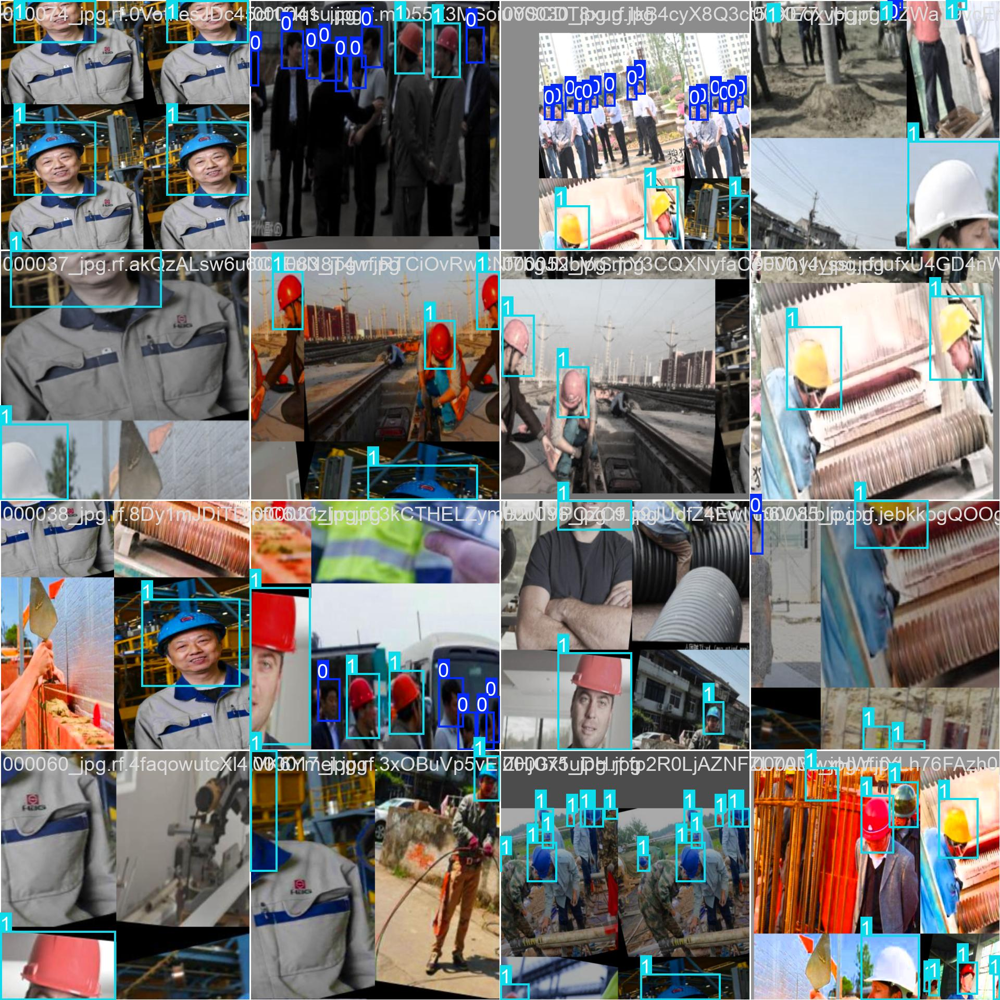

In [ ]:
Image("/content/runs/detect/train/train_batch0.jpg", width=600)


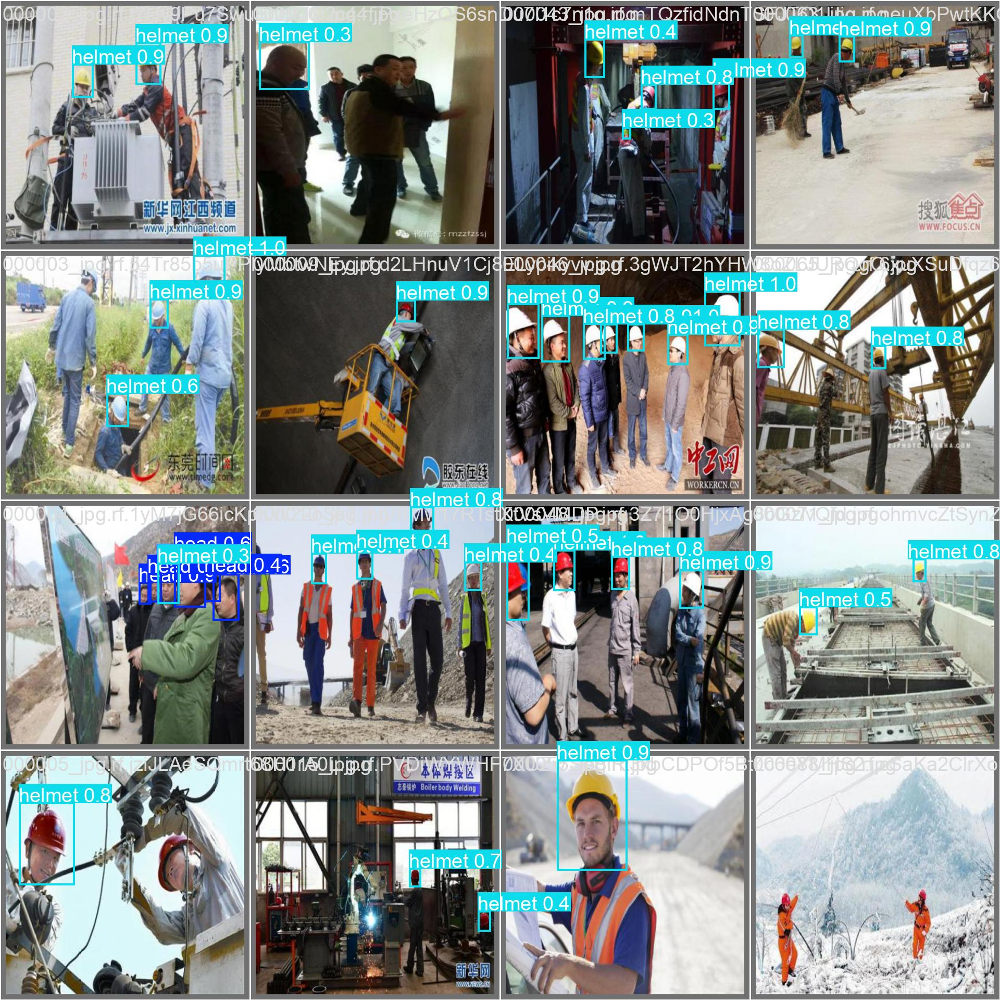

In [ ]:
Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)


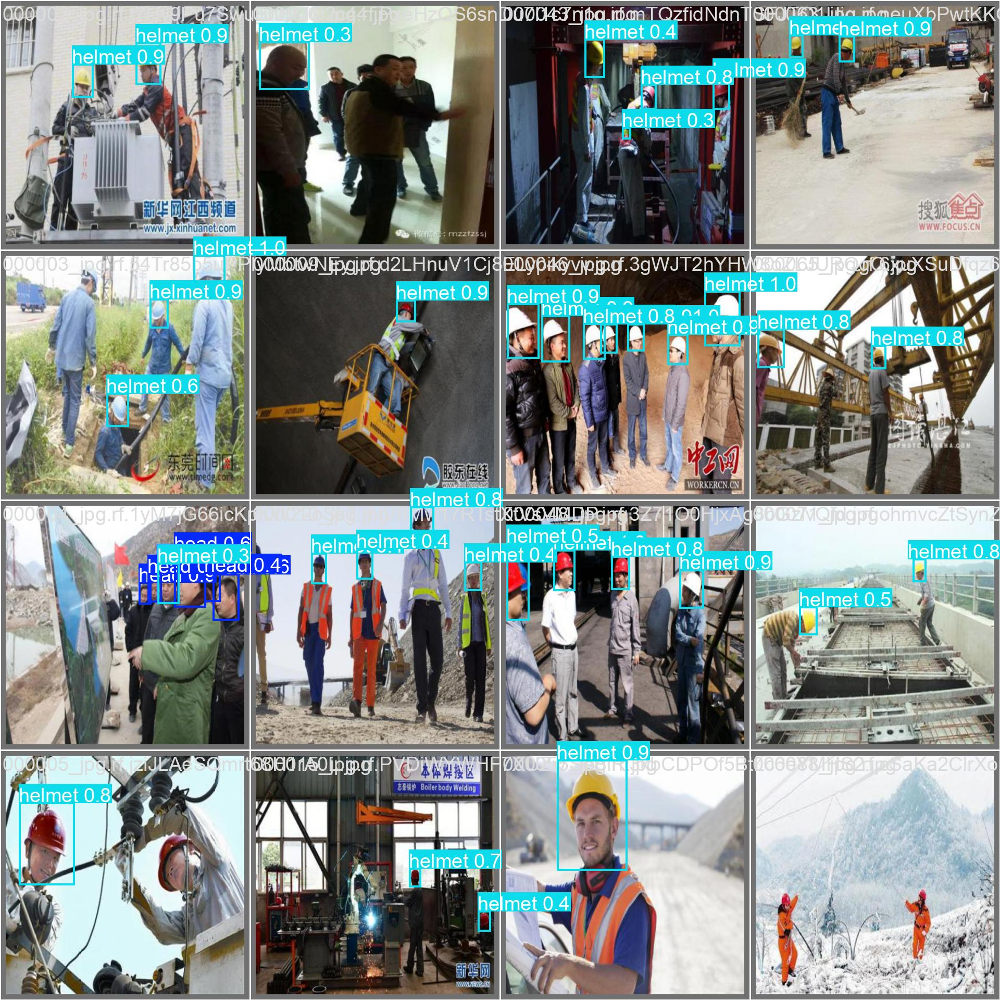

In [ ]:
Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)


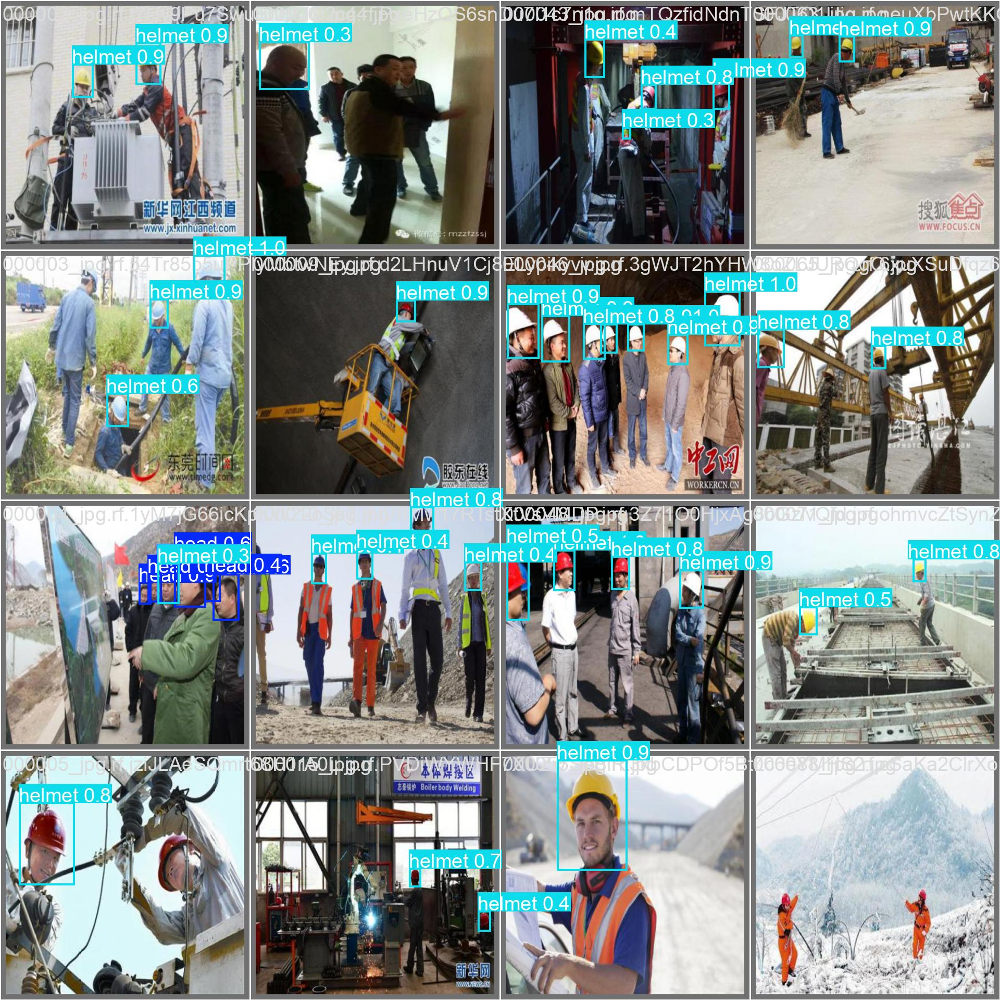

In [ ]:
Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)


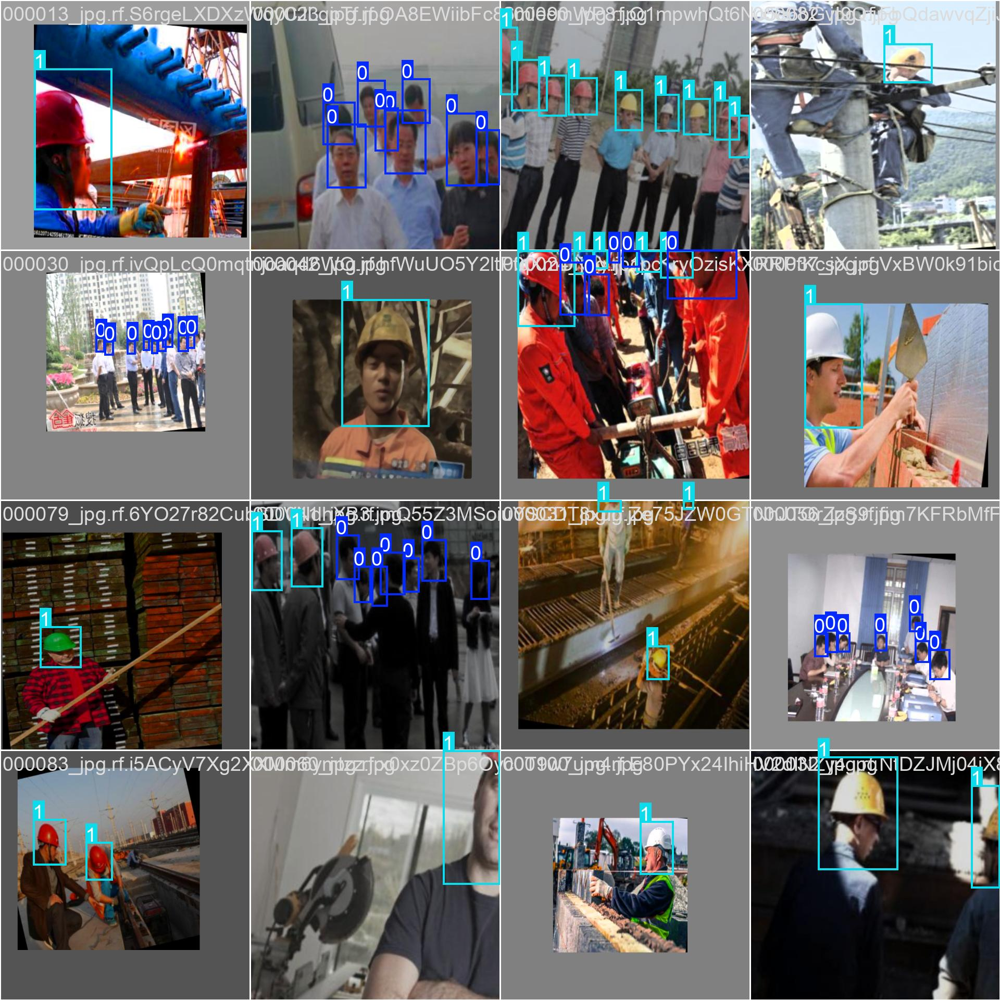

In [ ]:
Image("/content/runs/detect/train/train_batch562.jpg", width=600)


In [ ]:
!yolo task=detect mode=val model="/content/runs/detect/train/weights/best.pt" data={dataset.location}/data.yaml


Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/Hard-Hat-Sample-2/valid/labels.cache... 20 images, 0 backgrounds, 0 corrupt: 100% 20/20 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:01<00:00,  1.67it/s]
                   all         20         65      0.975      0.474      0.573      0.368
                  head          3         18          1      0.578      0.819       0.51
                helmet         17         45      0.926      0.844        0.9      0.595
                person          1          2          1          0          0          0
Speed: 0.3ms preprocess, 16.0ms inference, 0.0ms loss, 28.4ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [ ]:
!yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True


Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs

image 1/10 /content/Hard-Hat-Sample-2/test/images/000008_jpg.rf.srnl1sVAVr2EPRtGO3wM.jpg: 640x640 4 helmets, 13.6ms
image 2/10 /content/Hard-Hat-Sample-2/test/images/000011_jpg.rf.IimSKC585zgqy0pYkICd.jpg: 640x640 13 helmets, 15.6ms
image 3/10 /content/Hard-Hat-Sample-2/test/images/000034_jpg.rf.O4m3h2cvjjkkh849PCe4.jpg: 640x640 1 helmet, 10.9ms
image 4/10 /content/Hard-Hat-Sample-2/test/images/000047_jpg.rf.FUeIOm98Uvx0ac2APmgf.jpg: 640x640 5 helmets, 13.9ms
image 5/10 /content/Hard-Hat-Sample-2/test/images/000054_jpg.rf.GOV8HaobN2Vue7hI4tGS.jpg: 640x640 1 helmet, 14.6ms
image 6/10 /content/Hard-Hat-Sample-2/test/images/000073_jpg.rf.4gGSrC20u0NSVkxh2f8u.jpg: 640x640 8 helmets, 10.6ms
image 7/10 /content/Hard-Hat-Sample-2/test/images/000076_jpg.rf.UE3hCUJ6D9EO3iWME4Az.jpg: 640x640 1 helmet, 10.5ms
image 8/10 /content/Hard

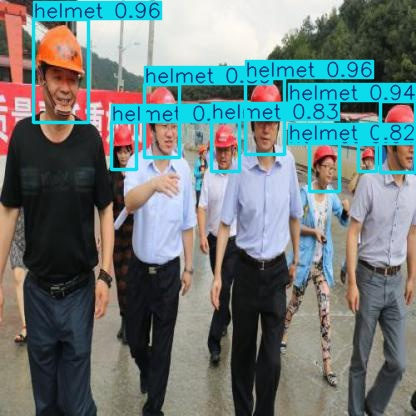

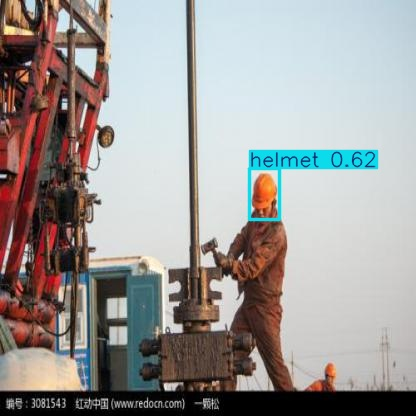

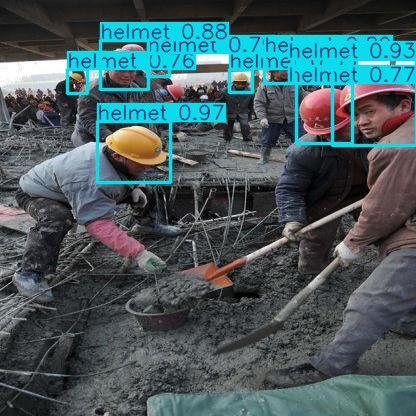

In [ ]:

import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [ ]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source=images.jpg save=True


Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/images.jpg: 448x640 8 helmets, 49.2ms
Speed: 3.5ms preprocess, 49.2ms inference, 567.7ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


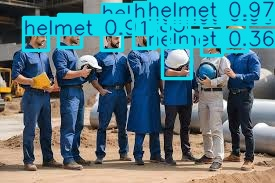

In [ ]:
Image("/content/runs/detect/predict2/images.jpg", width=600)


In [ ]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source="safetyguide.mov" save=True


Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/476) /content/safetyguide.mov: 384x640 10 helmets, 43.2ms
video 1/1 (frame 2/476) /content/safetyguide.mov: 384x640 10 helmets, 14.5ms
video 1/1 (frame 3/476) /content/safetyguide.mov: 384x640 9 helmets, 13.6ms
video 1/1 (frame 4/476) /content/safetyguide.mov: 384x640 10 helmets, 11.6ms
video 1/1 (frame 5/476) /content/safetyguide.mov: 384x640 8 helmets, 12.4ms
video 1/1 (frame 6/476) /content/safetyguide.mov: 384x640 10 helmets, 11.6ms
video 1/1 (frame 7/476) /content/safetyguide.mov: 384x640 8 helmets, 13.7ms
video 1/1 (frame 8/476) /content/safetyguide.mov: 384x640 8 helmets, 13.5ms
video 1/1 (frame 9/476) /content/safetyguide.mov: 384x640 8 helmets, 13.9ms
video 1/1 (frame 10/476) /content/safetyguide.mov: 384x640 8 helmets, 13.3ms
video 1/1 (frame 11/476) /content/safetyguide.mov: 384x640 9 helmets,

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict3/safetyguide.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

# Ensure FFmpeg runs successfully
os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Ensure the compressed file exists
if not os.path.exists(compressed_path):
    raise FileNotFoundError(f"Compressed video not created at {compressed_path}")

# Read the compressed video as binary
mp4 = open(compressed_path, 'rb').read()

# Create a base64-encoded URL for the video
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

# Generate the HTML for displaying the video
HTML(f"""
<video width="640" height="480" controls>
    <source src="{data_url}" type="video/mp4">
    Your browser does not support the video tag.
</video>
""")


In [ ]:
import shutil
from google.colab import files

# Path to the dataset directory
dataset_path = '/content/runs'

# Path to save the zipped file
zip_path = '/content/runs.zip'

# Create a zip archive of the dataset
shutil.make_archive(base_name=zip_path.replace('.zip', ''), format='zip', root_dir=dataset_path)


'/content/runs.zip'

In [ ]:
import shutil
from google.colab import files

# Path to the dataset directory
dataset_path = '/content/Hard-Hat-Sample-2'

# Path to save the zipped file
zip_path = '/content/Hard-Hat-Sample-2.zip'

# Create a zip archive of the dataset
shutil.make_archive(base_name=zip_path.replace('.zip', ''), format='zip', root_dir=dataset_path)


'/content/Hard-Hat-Sample-2.zip'